# Advanced Finding Lanes Project

1. Calibrate the camera
2. Undistort the image
3. Define the perspective transform to have a bird eye view of the road
4. Define the Sobel filter
5. Define the process pipeline  
    a- Undistort the image  
    b- Remove the part of the image to keep only the region of interest  
    c- Use color transform to highlight the white and yellow lanes  
    d- Apply the bird-eye view  
    e- Apply the Sobel filter to highlight the lanes  
    f- Find the lanes and compute the curvature  
    g- Unwarp the bird-eye view  
    h- Add the found lanes image to the original image  

In [1]:
# importing some useful packages
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2

from ipywidgets import widgets
from ipywidgets import interact, interactive, fixed, interact_manual

%matplotlib inline

In [2]:
def _build_full_paths(dir_root):
    return [dir_root+'/'+fn for fn in os.listdir(dir_root)]

def _show_dist_undist_images_by_2(images, title0='Original Image', title1='Undistorted Image'):
    for img, dst in images:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(img, cmap='gray')
        ax1.set_title(title0, fontsize=30)
        ax2.imshow(dst, cmap='gray')
        ax2.set_title(title1, fontsize=30)

## 1. Calibrate the camera

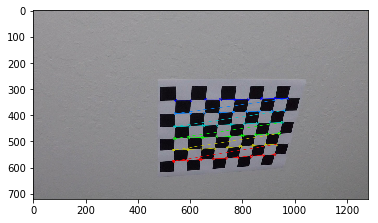

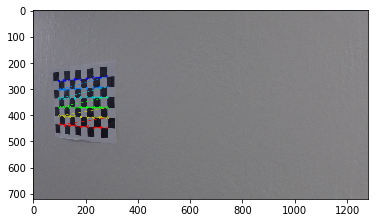

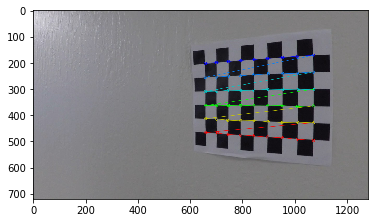

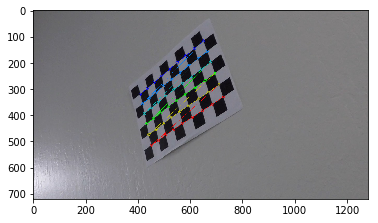

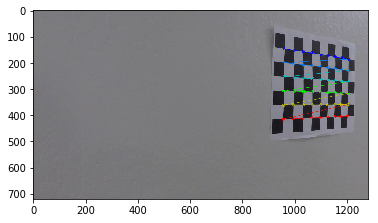

...

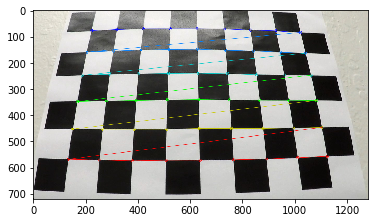

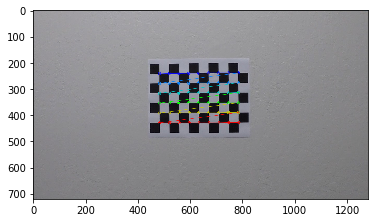

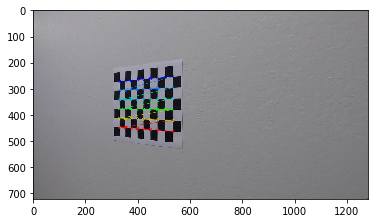

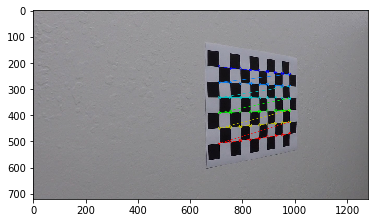

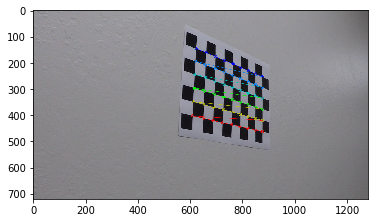

In [3]:
class CameraCalibrator:
    def __init__(self, nx=9, ny=6):
        self.nx = nx
        self.ny = ny
        self.mtx = None
        self.dist = None
        
    def _find_corners(self, filenames, show_images):
        objpoints, imgpoints = [], [] # 3d points in real world space, # 2d points in image plane.
    
        # Prepare obj points
        objp = np.zeros((self.nx * self.ny, 3), np.float32)
        objp[:,:2] = np.mgrid[0:self.nx, 0:self.ny].T.reshape(-1,2)
        
        img_size = None
    
        for fn in filenames:
            #reading in an image
            image = mpimg.imread(fn)
            gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)

            ret, corners = cv2.findChessboardCorners(gray, (self.nx,self.ny), None)
        
            if img_size is None:
                img_size = (image.shape[1], image.shape[0])
        
            if ret == True:
                objpoints.append(objp)
                imgpoints.append(corners)
                
                if show_images:
                    image = cv2.drawChessboardCorners(image, (self.nx, self.ny), corners, ret)
                    plt.imshow(image)
                    plt.figure()
    
        return objpoints, imgpoints, img_size
    
    def _calibrate_camera(self, objpoints, imgpoints, img_size):
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
        return mtx, dist
    
    def calibrate(self, filenames, show_images=False):
        objpoints, imgpoints, img_size = self._find_corners( filenames, show_images=show_images )
        self.mtx, self.dist = self._calibrate_camera(objpoints, imgpoints, img_size)
        return self.mtx, self.dist
       
        
ccal1 = CameraCalibrator()
ccal1.calibrate( _build_full_paths('camera_cal/'), show_images=True );

## 2. Undistort the image

In [4]:
class Undistorter:
    def __init__(self, camera_calibrator):
        self.camera_calibrator = camera_calibrator
        
    def undistort_image(self, img):
        mtx, dist = self.camera_calibrator.mtx, self.camera_calibrator.dist
        return cv2.undistort(img, mtx, dist, None, mtx)
        
    def read_undistort_images(self, filenames):
        undistorted_imgs = []
    
        for fn in filenames:
            img = mpimg.imread(fn)
        
            undst = self.undistort_image(img)
            undistorted_imgs.append( (img, undst, ) )
        
        return undistorted_imgs
        
undistorter = Undistorter(ccal1)

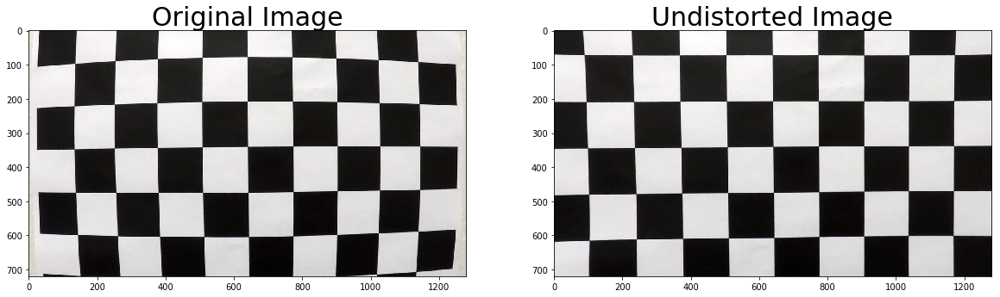

In [5]:
_show_dist_undist_images_by_2( undistorter.read_undistort_images([ 'camera_cal/calibration1.jpg' ]) )

## 3. Define the perspective transform to have a bird eye view of the road

In [6]:
class PerspectiveWarper:
    def __init__(self):
        self.M = None
        self.Minv = None
        
    def _perspective(self, matrix, img):  
        if matrix is None:
            raise ValueError("!!! The matrix M must be computed by method compute_perspective_transform() before calling warp_perspective()")
            
        img_size = (img.shape[1], img.shape[0])
        return cv2.warpPerspective(img, matrix, img_size)
    
    def compute_perspective_transform(self, src, dst):
        self.M = cv2.getPerspectiveTransform(src, dst)
        self.Minv = cv2.getPerspectiveTransform(dst, src)
    
    def warp_perspective(self, img):
        return self._perspective(self.M, img)
    
    def unwarp_perspective(self, img):
        return self._perspective(self.Minv, img)

In [7]:
persp_warper = PerspectiveWarper()

# Compute the perspective matrix for the road:
def compute_road_perspective_matrix(perspective_warper):
    # src = np.float32([[535, 460], [750, 460], [1480, 720], [-180, 720]])
    src = np.float32([[535, 460], [750, 460], [1480, 720], [-180, 720]])
    dst = np.float32([[0, 0], [1280, 0], [1280, 720], [0, 720]])
    
    perspective_warper.compute_perspective_transform(src, dst)

compute_road_perspective_matrix(persp_warper)

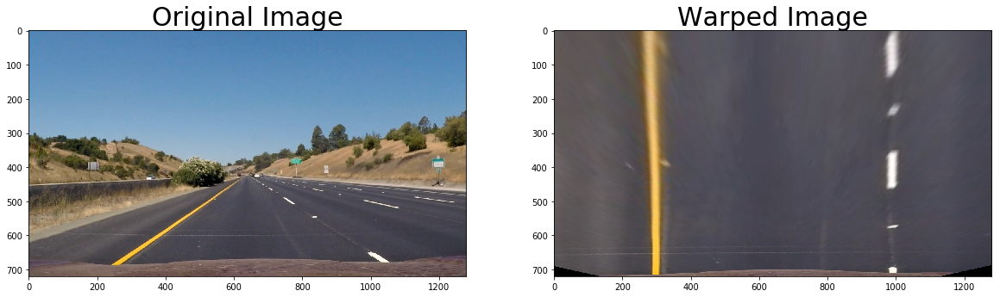

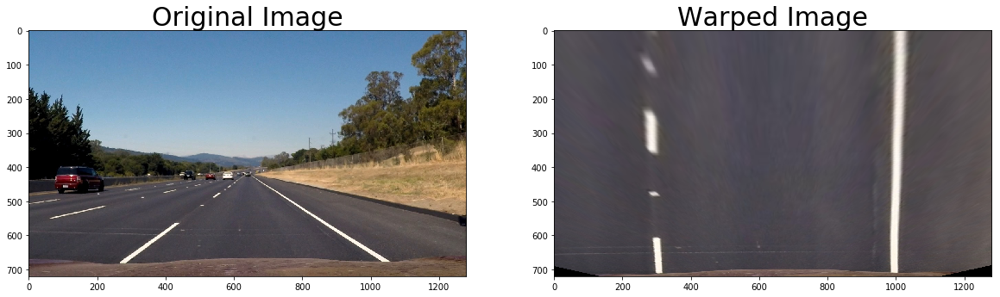

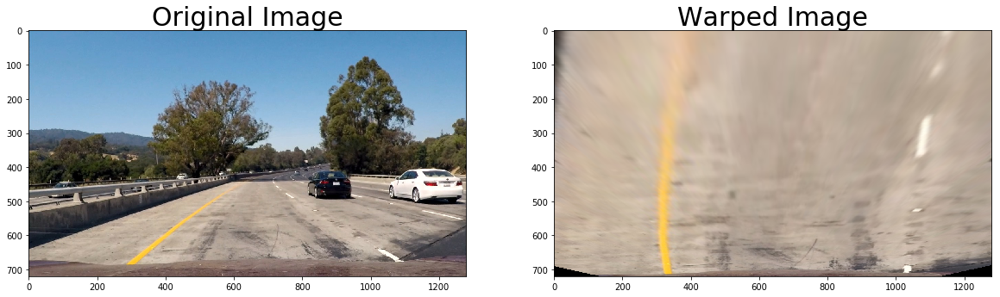

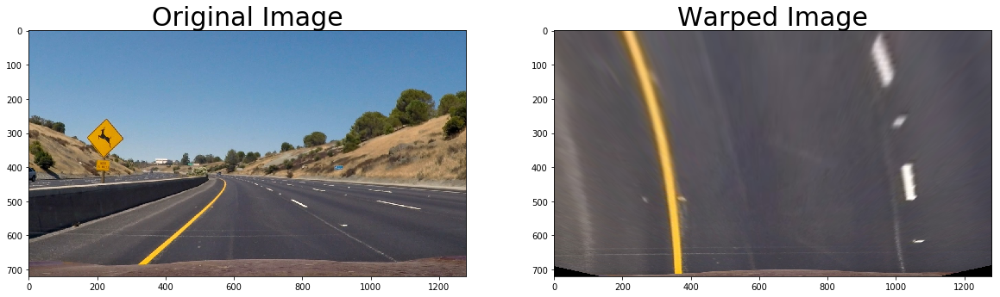

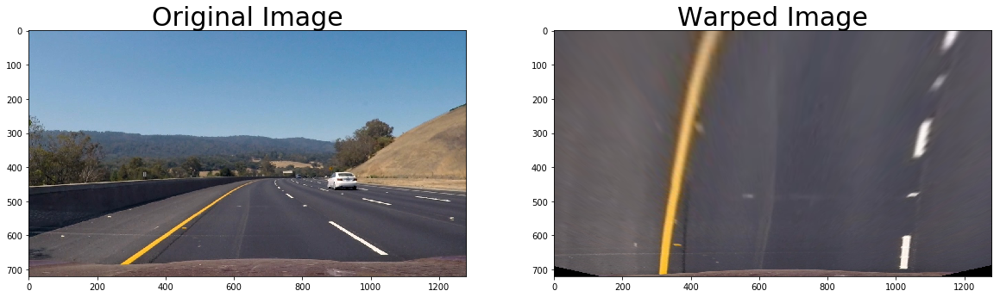

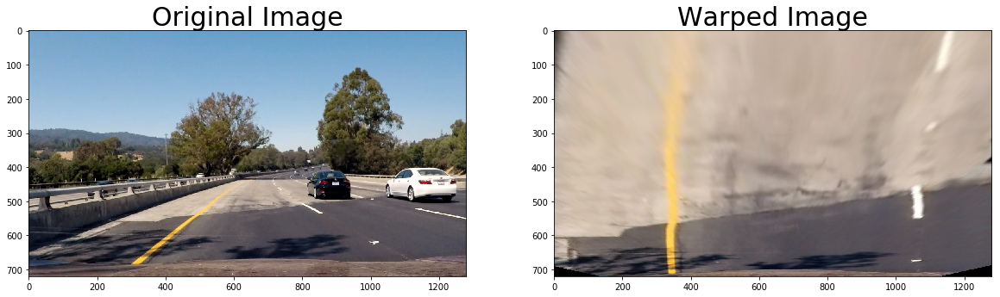

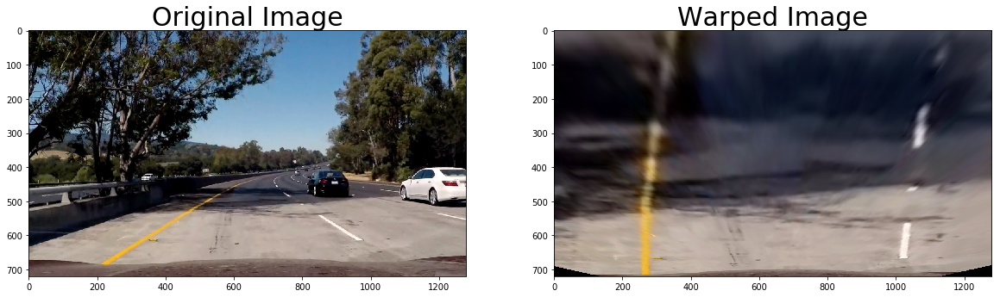

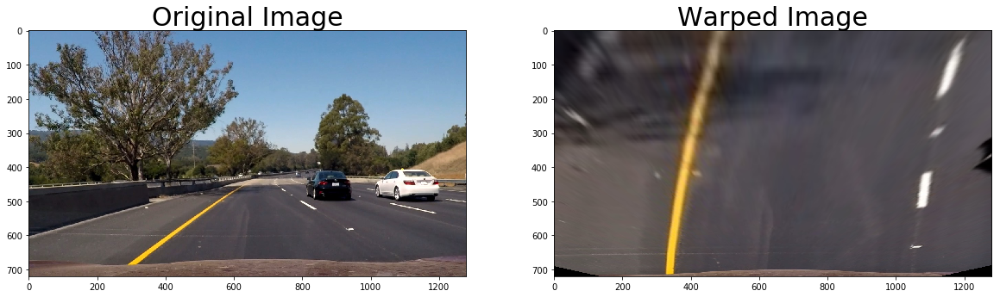

In [8]:
def read_perspective_warper_road_images(warp_perspective_fct, filenames):
    result = []
    for fn in filenames:
        img = mpimg.imread(fn)
        undist = undistorter.undistort_image(img)
        warped = warp_perspective_fct(undist)
        
        if warped is None:
            continue
        
        result.append( (img, warped,) )
        
    return result

_show_dist_undist_images_by_2( read_perspective_warper_road_images(persp_warper.warp_perspective, _build_full_paths('test_images/')), title1='Warped Image' )


## 4. Define the Sobel filter

In [9]:
class ImageSobelThresholder:
    def __init__(self, sobel_kernel=9, abs_thresh=(20,100), mag_thresh=(30, 100), dir_thresh=(0.7, 1.3)):
        self.sobel_kernel = sobel_kernel
        
        # Absolute sobelthreshold
        self.abs_thresh = abs_thresh
        self.mag_thresh = mag_thresh
        self.dir_thresh = dir_thresh
        
    def abs_sobel_threshold(self, gray, orient='x'):
        # Take the derivative in x or y given orient = 'x' or 'y'
        if orient == 'x':
            sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=self.sobel_kernel)
        elif orient == 'y':
            sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=self.sobel_kernel)
    
        # Take the absolute value of the derivative or gradient
        abs_sobel = np.absolute(sobel)
    
        # Scale to 8-bit (0 - 255) then convert to type = np.uint8
        scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
        # Create a mask of 1's where the scaled gradient magnitude is > thresh_min and < thresh_max
        binary_output = np.zeros_like(scaled_sobel)
        binary_output[(scaled_sobel >= self.abs_thresh[0]) & (scaled_sobel <= self.abs_thresh[1])] = 1

        # Return this mask as your binary_output image
        return binary_output
    
    
    def mag_sobel_threshold(self, gray):
        # Take both Sobel x and y gradients
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=self.sobel_kernel)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=self.sobel_kernel)
        # Calculate the gradient magnitude
        gradmag = np.sqrt(sobelx**2 + sobely**2)
        # Rescale to 8 bit
        scale_factor = np.max(gradmag)/255. 
        gradmag = (gradmag/scale_factor).astype(np.uint8) 
        # Create a binary image of ones where threshold is met, zeros otherwise
        binary_output = np.zeros_like(gradmag)
        binary_output[(gradmag >= self. mag_thresh[0]) & (gradmag <= self.mag_thresh[1])] = 1

        # Return the binary image
        return binary_output
    
    
    def dir_sobel_threshold(self, gray):
        # Calculate the x and y gradients
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=self.sobel_kernel)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=self.sobel_kernel)
        # Take the absolute value of the gradient direction, 
        # apply a threshold, and create a binary image result
        absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
        binary_output =  np.zeros_like(absgraddir)
        binary_output[(absgraddir >= self.dir_thresh[0]) & (absgraddir <= self.dir_thresh[1])] = 1

        # Return the binary image
        return binary_output
    
    
    def combined_sobel_thresholds(self, gray):
        # Apply each of the thresholding functions
        gradx = self.abs_sobel_threshold(gray, orient='x')
        grady = self.abs_sobel_threshold(gray, orient='y')
        mag_binary = self.mag_sobel_threshold(gray)
        dir_binary = self.dir_sobel_threshold(gray)
    
        combined = np.zeros_like(dir_binary)
        combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
        return combined
    
    def gray_combined_sobel_thresholds(self, undist):
        gray = cv2.cvtColor(undist, cv2.COLOR_RGB2GRAY)
        return self.combined_sobel_thresholds(gray)
    
sobel_thresholder = ImageSobelThresholder()

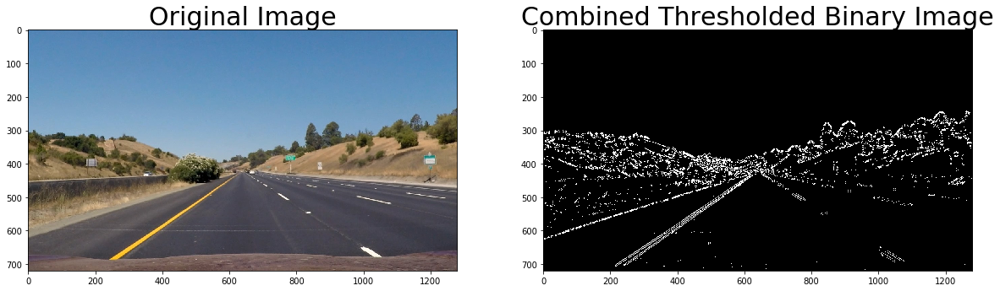

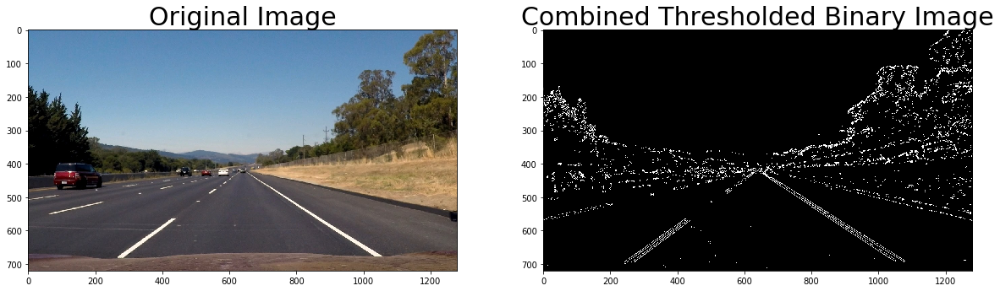

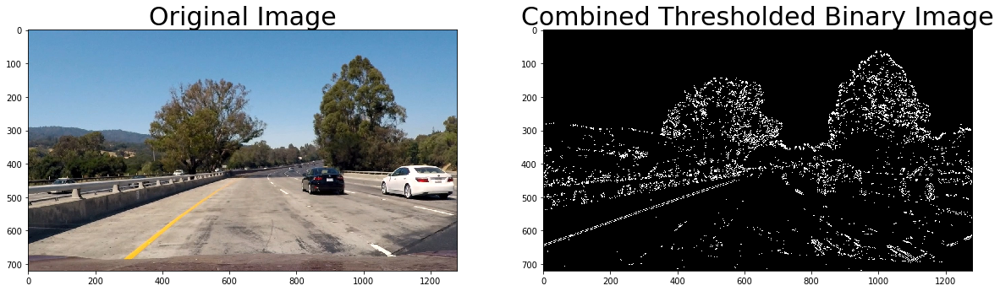

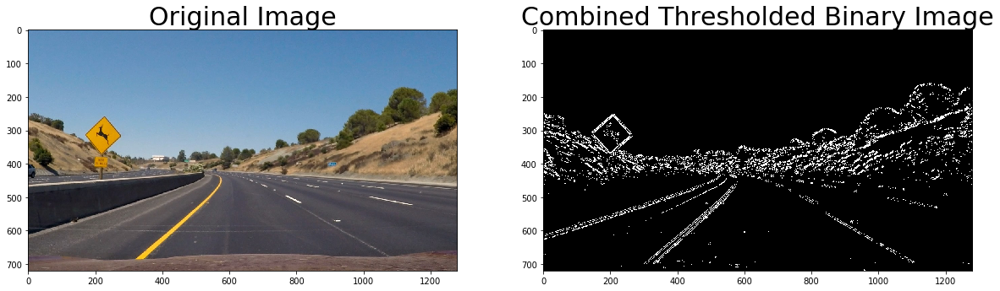

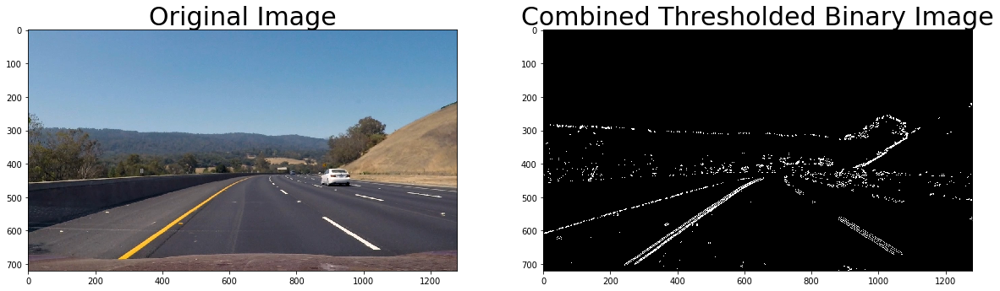

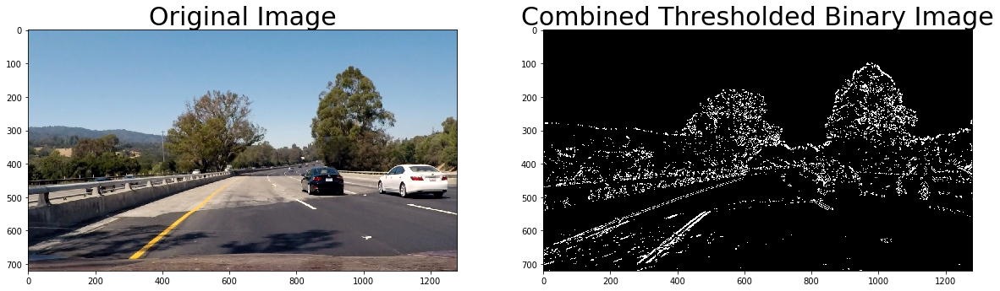

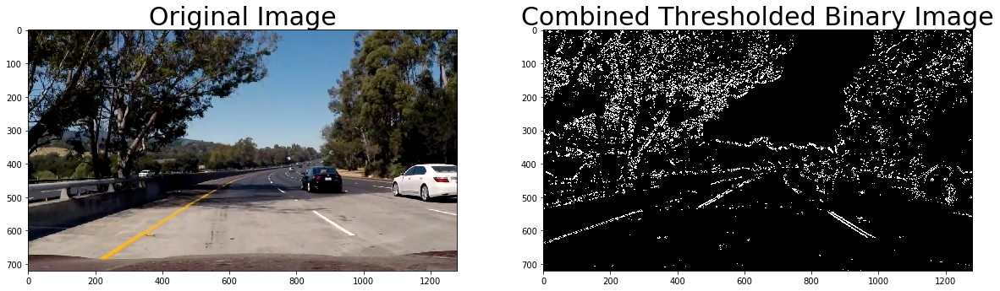

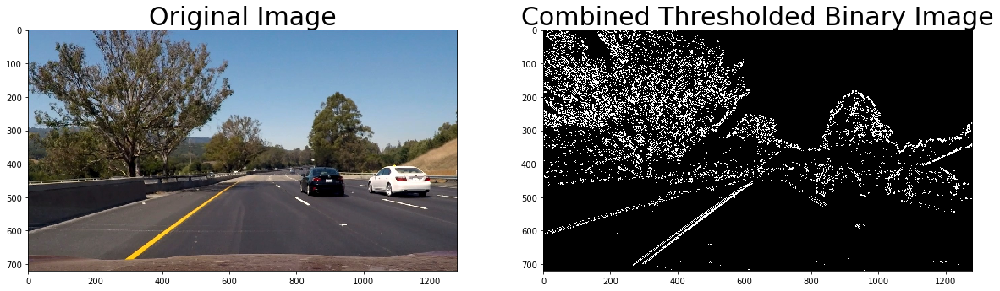

In [10]:
def apply_thresholds(undist, threshold_fct, cvt_2_gray=True):
    if cvt_2_gray:
        gray = cv2.cvtColor(undist, cv2.COLOR_RGB2GRAY)
        return threshold_fct(gray)
    else:
        return threshold_fct(undist)

def show_thresholded_binary_images(undistorter, threshold_fct, cvt_2_gray=True):
    result = []
    for fn in _build_full_paths("test_images/"):
        img = mpimg.imread(fn)
        undist = undistorter.undistort_image(img)
        
        # undist = persp_warper.warp_perspective(undist)
        
        thres_img = apply_thresholds(undist, threshold_fct, cvt_2_gray)
        result.append( (img, thres_img,) )
        
    return result

_show_dist_undist_images_by_2( show_thresholded_binary_images(undistorter, sobel_thresholder.combined_sobel_thresholds), title1='Combined Thresholded Binary Image' )

## 5. Define the process pipeline

In [11]:
# Functions used by the process pipeline

def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    # return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
def canny(img, low_threshold, high_threshold):
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def region_of_interest(img, vertices):
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


def filter_white_yellow(img):
    def mask(hsv, hsv_lower, hsv_upper):
        return cv2.inRange(hsv, np.array(hsv_lower, dtype=np.uint8), np.array(hsv_upper, dtype=np.uint8))
        
    # Convert BGR to HSV
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        
    mask_yellow = mask(hsv, [20,100,100], [52,255,255])
    sensitivity = 50
    mask_white = mask(hsv, [0,0,255-sensitivity], [255, sensitivity, 255])
    mask = cv2.bitwise_or(mask_white, mask_yellow)
        
    return cv2.bitwise_and(img, img, mask=mask)


def draw_lines(img, lines, color=[255, 0, 0], thickness=7):
    for line in lines:
        for x1,y1,x2,y2 in line:
            cv2.line(img, (x1, y1), (x2, y2), color, thickness)

            
def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines(line_img, lines)
    return line_img


def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    return cv2.addWeighted(initial_img, α, img, β, λ)


def perspective(img):
    height, width, ch = img.shape
    half_height = 0.6*height
    vertices = np.array([[(0,height),(0.43*width, half_height), (0.58*width, half_height), (width,height)]], dtype=np.int32)
    return region_of_interest(img, vertices)


In [12]:
# Each image is split vertically into (nb_window) windows.
# The class Lanes keeps track models the positions of the lanes (right and left), for each vertical window.

# At the construction of the class, if there is no position for a window, the missing data is computed as following:
# 1. if it is the last window (ie the one on top), take the position of the previous window;
# 2. if it is the first window, find the first window having a position and take this value;
# 3. else take the position of the previous window

# To estimate the positions of the lanes:
# 1. for each window, compute a box with a margin around the position found previously;
# 2. take all points within this box activated (ie having a value of 1);
# 3. compute a second degree polynom for each lane, fitting the points found previously.
# 4. draw the zone of interest defines by these 2 computed lanes

class Lanes:
    def __init__(self, lanes):
        self.lanes = self._correct_missing_data(lanes)

    def _correct_missing_data(self, lanes):
        for idx, lane_r, lane_l in lanes:
            if lane_r is None or (lane_l is not None and (lane_r <= lane_l or lane_r <= 5.)):
                # Lane right is wrong
                if idx >= (len(lanes)-1):
                    lane_r = lanes[len(lanes)-2][1]
                elif idx >= 0:
                    for i in range(len(lanes)):
                        value = lanes[i][1]
                        if value is not None:
                            lane_r = value
                            break
                #else:
                #    lane_r = int(lanes[idx-1][1])
                
            if lane_l is None or lane_l <= 5.:
                # Lane right is wrong
                if idx >= (len(lanes)-1):
                    lane_l = lanes[len(lanes)-2][2]
                elif idx >= 0:
                    for i in range(len(lanes)):
                        value = lanes[i][2]
                        if value is not None:
                            lane_l = value
                            break
                #else:
                #    lane_l = int(lanes[idx-1][2])
                
            lanes[idx] = (idx, lane_r, lane_l,)
    
        return lanes
        
    def _complete_with_previous_lanes_data(self, lanes, previous_lane):
        if previous_lane is None:
            return lanes
        
        nb_lanes = len(lanes)
        
        for idx, lane_r, lane_l in lanes:
            if lane_r is None:
                lane_r = previous_lane.lanes[nb_lanes-1][1]
                
            if lane_l is None:
                lane_l = previous_lane.lanes[nb_lanes-1][2]
                
            lanes[idx] = (idx, lane_r, lane_l,)
        
        return lanes
        
    def find(self, binary, previous_lane, margin=50, debug=False):
        def draw_fitting_zone(ploty, right_fitx, left_fitx):
            # Create an image to draw the lines on
            warp_zero = np.zeros_like(binary).astype(np.uint8)
            color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

            # Recast the x and y points into usable format for cv2.fillPoly()
            pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
            pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
            pts = np.hstack((pts_left, pts_right))
 
            # Draw the lane onto the warped blank image
            cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
            return color_warp
        
        # Define conversions in x and y from pixels space to meters
        # xm_per_pix = 3.7/700 # meters per pixel in x dimension
        # ym_per_pix = 30/720 # meters per pixel in y dimension
        def measure_curvature(ploty, right_fitx, left_fitx, xm_per_pix = 3.7/700., ym_per_pix = 30./720.):
            def compute_curvature(ploty, y_eval, fitx):
                if fitx is None or len(fitx) == 0:
                    return None
                
                fit_cr = np.polyfit(ploty*ym_per_pix, fitx*xm_per_pix, 2)
                curverad = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
                return curverad
                
            y_eval = np.max(ploty)
            return compute_curvature(ploty, y_eval, right_fitx), compute_curvature(ploty, y_eval, left_fitx)

        
        def get_points_in_box(lane_indexes, lane, win_from, win_to, margin, debug_img, color_debug):
            if lane is None:
                return
            
            win_low, win_high = lane - margin, lane + margin
            
            if debug:
                cv2.rectangle(debug_img,(win_low,win_from),(win_high,win_to),color_debug, 2)
                
            win_indexes = np.nonzero( (nonzero1 >= win_low) & (nonzero1 < win_high) & 
                                        (nonzero0 > win_from) & (nonzero0 <= win_to) )[0]
            lane_indexes.append( win_indexes )
        
        
        def fit_cloud_of_points(lane_indexes, ploty, lane):
            x = nonzero1[lane_indexes]
            y = nonzero0[lane_indexes]
            
            if len(x) == 0:
                x, y = [], []
                for idx, lane_x in lane:
                    x.append(lane_x)
                    y.append(binary.shape[0] - (idx * window_height))
            
            fit = np.polyfit(y, x, 2)
            
            fitx = fit[0]*ploty**2 + fit[1]*ploty + fit[2]
            return fitx
        
        window_height = np.int(binary.shape[0]/len(self.lanes))
        
        debug_img = None
        if debug:
            debug_img = np.dstack((binary, binary, binary))*255
        
        nonzero = np.nonzero(binary)
        nonzero0 = nonzero[0] # Non-zero along the dimension 0 (height)
        nonzero1 = nonzero[1] # Non-zero along the dimension 1 (width)
        
        lane_r_indexes, lane_l_indexes = [], []
        
        self.lanes = self._complete_with_previous_lanes_data(self.lanes, previous_lane)
        
        for idx, lane_r, lane_l in self.lanes:
            if lane_r is None or lane_l is None:
                print(self.lanes)
            
            
            # Height of the window
            win_from = binary.shape[0] - ((idx+1) * window_height)
            win_to = binary.shape[0] - (idx * window_height) 
            
            get_points_in_box(lane_r_indexes, lane_r, win_from, win_to, margin, debug_img, (255,0,0))
            get_points_in_box(lane_l_indexes, lane_l, win_from, win_to, margin, debug_img, (0,255,0))
            
        lane_r_indexes = np.concatenate(lane_r_indexes)
        lane_l_indexes = np.concatenate(lane_l_indexes)
        
        ploty = np.linspace(0, binary.shape[0]-1, binary.shape[0] )
        
        right_fitx = fit_cloud_of_points(lane_r_indexes, ploty, [(idx, lane_r) for idx, lane_r, lane_l in self.lanes])
        left_fitx = fit_cloud_of_points(lane_l_indexes, ploty,  [(idx, lane_l) for idx, lane_r, lane_l in self.lanes])
        
        if debug:
            debug_img[nonzero0[lane_r_indexes], nonzero1[lane_r_indexes]] = [0, 255, 255]
            debug_img[nonzero0[lane_l_indexes], nonzero1[lane_l_indexes]] = [255, 255, 0]
        
        # Compute the curvature:
        right_curverad, left_curverad = measure_curvature(ploty, right_fitx, left_fitx)
        
        out_img = draw_fitting_zone(ploty, right_fitx, left_fitx)
        
        return debug_img, out_img, right_curverad, left_curverad

    
# This function find the lanes from the binary image (created after applying the Sobel filter).
# 2 algorithms are used to find the lanes:
# 1. the first algo use the convolution to find the peaks in the first part and the second part of the image;
# 2. the second algo finds all maximas and compute an average weighted with the value of the peak.
def lanes_finder(binary, nb_window=5, window_width=50, debug=False):
    def find_local_maxima(histogram):
        # Algo according:
        # http://matlabtricks.com//post-47/find-local-maximas-of-an-1d-signal-by-convolution
        return np.where(np.convolve(np.sign(np.diff(histogram)), [-1,1]) == 2);
    
    def find_lanes_algo_1(histogram, win_from, win_to, mid_point):
        histogram_r = np.sum(binary[win_from:win_to,mid_point:], axis=0)
        histogram_l = np.sum(binary[win_from:win_to,:mid_point], axis=0)
        
        lane_r = np.argmax(np.convolve(window,histogram_r))-int(window_width/2)+mid_point
        lane_l = np.argmax(np.convolve(window,histogram_l))-int(window_width/2)
        return lane_r, lane_l
    
    def find_lanes_algo_2(histogram, win_from, win_to, mid_point):
        maximas = find_local_maxima(histogram)
        
        possible_lane_r = [i for i in maximas[0] if i >= mid_point]
        possible_lane_l = [i for i in maximas[0] if i <= mid_point]
        
        lane_r, lane_l = None, None
        
        if len(possible_lane_r) >= 1:
            lane_r = int(np.average(possible_lane_r, weights=[histogram[i] for i in possible_lane_r]))
            
        if len(possible_lane_l) >= 1:
            lane_l = int(np.average(possible_lane_l, weights=[histogram[i] for i in possible_lane_l]))
            
        return lane_r, lane_l
    
    window_height = np.int(binary.shape[0]/nb_window)
    window = np.ones(window_width)
    
    lanes = []
    
    for idx in range(nb_window):
        win_from = binary.shape[0] - ((idx+1) * window_height)
        win_to = binary.shape[0] - (idx * window_height)
        
        mid_point = int(binary.shape[1]/2)
        histogram = np.sum(binary[win_from:win_to,:], axis=0)
        
        # algo 1&2
        lane_r_0, lane_l_0 = find_lanes_algo_1(histogram, win_from, win_to, mid_point)
        lane_r_1, lane_l_1 = find_lanes_algo_2(histogram, win_from, win_to, mid_point)
        
        lane_r = None
        if lane_r_0 is not None and lane_r_1 is not None:
            lane_r = min(lane_r_0, lane_r_1)
            
        lane_l = None
        if lane_l_0 is not None and lane_l_1 is not None:
            lane_l = max(lane_l_0, lane_l_1)
        
        lanes.append( (idx, lane_r, lane_l, ) )
        
    if debug:
        for idx, lane_r, lane_l in lanes:
            plt.text(lane_r, histogram[lane_r], "XR")
            plt.text(lane_l, histogram[lane_l], "XL")
        
            plt.plot(histogram)
            plt.figure()
    
    return Lanes(lanes)
    

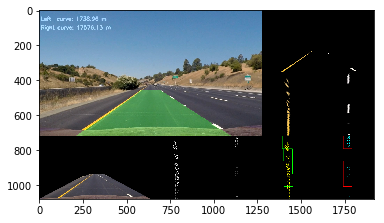

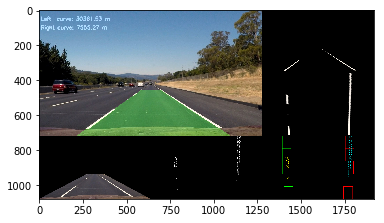

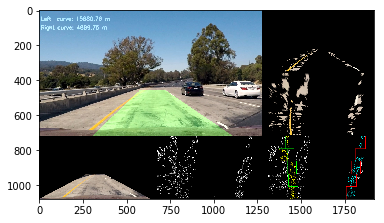

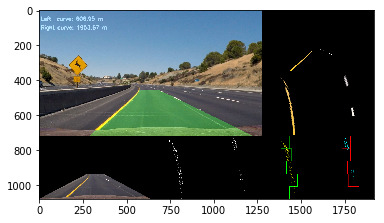

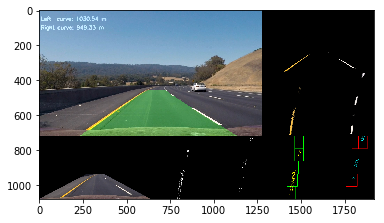

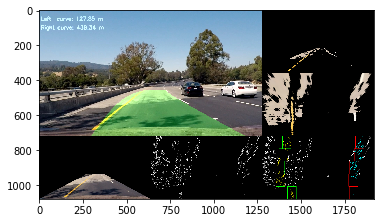

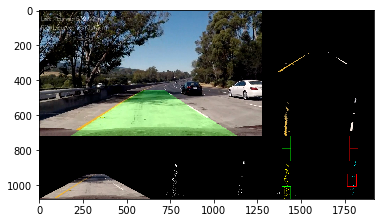

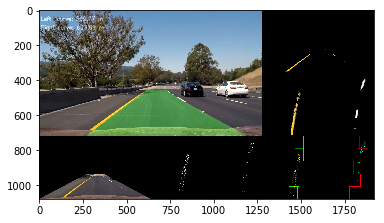

In [13]:
from moviepy.editor import VideoFileClip
from moviepy.video.io.bindings import mplfig_to_npimage

from IPython.display import HTML

# The process_image() function  
# 1. Undistort the image
# 2. Reduce the image to the zone of interest
# 3. Apply a perspective transform to have a bird-eye view
# 4. Filter to highlight the yellow and white in the image
# 5. Apply the Sobel filter (after blurring to reduce noise and transforming the image to grayscale)
# 6. Find the lanes and compute the curvatures
# 7. Unwarp the bird-eye view
# 8. Display the result

class ImageProcessor:
    def __init__(self):
        self.previous_lane = None

    def process_image(self, img, debug=False):
        def putText(img, title, location):
            font = cv2.FONT_HERSHEY_SIMPLEX
            cv2.putText(img, title, location, font, 1,(255,255,255), 3,cv2.LINE_AA)
    
        def show_debug(img, debug_img, perspect, filtered, sobel, edges, warped):
            shape = img.shape
            new_shape = (int(shape[0] * 1.5), int(shape[1] * 1.5), 3)
            dimg = np.zeros(new_shape, dtype=img.dtype)
    
            dimg[:shape[0], :shape[1]] = weighted_img(edges, img, α=1., β=0.3, λ=0.)
            half_shape = (shape[0] // 2, shape[1] // 2)
    
            offset = shape[1]
    
            # Display top right side image
            dimg[:shape[0]//2, offset:offset+shape[1]//2,:] = cv2.resize(filtered, half_shape[::-1])
        
            # Display bottom right side image
            dimg[shape[0]//2:shape[0], offset:offset+shape[1]//2,:] = cv2.resize(warped, half_shape[::-1])
            #dimg[shape[0]//2:shape[0], offset:offset+shape[1]//2,0] = side_img
            #dimg[shape[0]//2:shape[0], offset:offset+shape[1]//2,1] = side_img
            #dimg[shape[0]//2:shape[0], offset:offset+shape[1]//2,2] = side_img
    
            # Display bottom left image
            dimg[shape[0]:, :shape[1]//2,:] = cv2.resize(perspect, half_shape[::-1])
    
            # Display bottom center image
            sobel = sobel * 255
            bottom_img = cv2.resize(sobel, half_shape[::-1])
            dimg[shape[0]:, shape[1]//2:shape[1],0] = bottom_img
            dimg[shape[0]:, shape[1]//2:shape[1],1] = bottom_img
            dimg[shape[0]:, shape[1]//2:shape[1],2] = bottom_img
        
            # Display bottom right image
            dimg[shape[0]:, shape[1]:2*shape[1],:] = cv2.resize(debug_img, half_shape[::-1])
            #dimg[shape[0]:, shape[1]:2*shape[1],0] = bottom_right
            #dimg[shape[0]:, shape[1]:2*shape[1],1] = bottom_right
            #dimg[shape[0]:, shape[1]:2*shape[1],2] = bottom_right
        
            return dimg
    
        undist = undistorter.undistort_image(img)
        perspect = perspective(undist)
        filtered = filter_white_yellow(perspect)
        warped = persp_warper.warp_perspective(filtered)
    
        gray = grayscale(warped)
        blur = gaussian_blur(gray, 3) 
        sobel = sobel_thresholder.combined_sobel_thresholds(blur)
        # sobel = sobel * 255
    
        lanes = lanes_finder(sobel)
        debug_img , edges, right_curverad, left_curverad = lanes.find(sobel, self.previous_lane, debug=debug)
        edges = persp_warper.unwarp_perspective(edges)
        edges = edges.astype(np.uint8)
    
        putText(edges, 'Left  curve: %.2f m'%(left_curverad), (10,60))
        putText(edges, 'Right curve: %.2f m'%(right_curverad), (10,110))
    
        self.previous_lane = lanes
    
        if debug:
            return show_debug(img, debug_img, perspect, filtered, sobel, edges, warped)
        else:
            return weighted_img(edges, img, α=1., β=0.3, λ=0.)

    def debug_process_image(self, img):
        return self.process_image(img, debug=True)
    
image_processor = ImageProcessor()

for fn in _build_full_paths("test_images/"):
    img = mpimg.imread(fn)
    plt.imshow(image_processor.debug_process_image(img))
    plt.figure()

In [14]:
def process_save_video(project_input, project_output, process_img_fct):
    clip1 = VideoFileClip(project_input)
    project_clip = clip1.fl_image(process_img_fct) 

    %time project_clip.write_videofile(project_output, audio=False)
        

In [15]:
# Debug project video
image_processor = ImageProcessor()
process_save_video("project_video.mp4", "debug_project.mp4", image_processor.debug_process_image)

[MoviePy] >>>> Building video debug_project.mp4
[MoviePy] Writing video debug_project.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [03:56<00:00,  5.32it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: debug_project.mp4 

Wall time: 3min 56s


In [16]:
HTML("""
<video width="960" height="540" controls>
    <source src="{0}">
</video>
""".format("debug_project.mp4"))

In [17]:
# Project video
image_processor = ImageProcessor()
process_save_video("project_video.mp4", "project.mp4", image_processor.process_image)

[MoviePy] >>>> Building video project.mp4
[MoviePy] Writing video project.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [03:21<00:00,  6.35it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project.mp4 

Wall time: 3min 21s


In [18]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("project.mp4"))

In [19]:
# Debug Challenge video
image_processor = ImageProcessor()
process_save_video("challenge_video.mp4", "debug_challenge.mp4", image_processor.debug_process_image)

[MoviePy] >>>> Building video debug_challenge.mp4
[MoviePy] Writing video debug_challenge.mp4


100%|████████████████████████████████████████████████████████████████████████████████| 485/485 [01:29<00:00,  5.45it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: debug_challenge.mp4 

Wall time: 1min 29s


In [20]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("debug_challenge.mp4"))

In [21]:
# Challenge video
image_processor = ImageProcessor()
process_save_video("challenge_video.mp4", "challenge.mp4", image_processor.process_image)

[MoviePy] >>>> Building video challenge.mp4
[MoviePy] Writing video challenge.mp4


100%|████████████████████████████████████████████████████████████████████████████████| 485/485 [01:16<00:00,  6.29it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge.mp4 

Wall time: 1min 16s


In [22]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("challenge.mp4"))

In [23]:
# Debug Harder Challenge video
image_processor = ImageProcessor()
process_save_video("harder_challenge_video.mp4", "debug_harder_challenge.mp4", image_processor.debug_process_image)

[MoviePy] >>>> Building video debug_harder_challenge.mp4
[MoviePy] Writing video debug_harder_challenge.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1199/1200 [03:49<00:00,  5.26it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: debug_harder_challenge.mp4 

Wall time: 3min 50s


In [24]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("debug_harder_challenge.mp4"))

In [29]:
# Challenge video
image_processor = ImageProcessor()
process_save_video("harder_challenge_video.mp4", "harder_challenge.mp4", image_processor.process_image)

OSError: [WinError 6] The handle is invalid

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("harder_challenge.mp4"))